# Automobilová doprava

In [1]:
import pandas as pd
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import json

## Floating Car Data
Data možná získat za období od 1.6.2020

https://registr.dopravniinfo.cz/cs/index.html

Sloupce, které by mohly být zajímavé:
- source_identification - id daného úseku (viz TCM lokační tabulky)
- measurement_or_calculation_time - čas získní záznamu
- traffic_level
- ~~queue_exists~~ - konstantní hodnota False
- ~~queue_length~~ - nemá hodnoty
- average_vehicle_speed
- travel_time
- free_flow_travel_time
- free_flow_speed - maximální povolená rychlost

In [2]:
df_fcd = pd.read_csv('fcd_traff_params_part_20250602_PO.csv', sep=';')
df_fcd.head()

,publication_time,source_identification,measurement_or_calculation_time,predefined_location,version_of_predefined_location,traffic_level,queue_exists,queue_length,from_point,to_point,...,average_vehicle_speed,travel_time,free_flow_travel_time,free_flow_speed,create_batch_id,created_at,created_by,update_batch_id,updated_at,updated_by
0,2025-06-02 00:00:12.000 +0200,TS01225T25680,2025-06-02 00:00:01.000 +0200,TS01225T25680,241201,level3,False,NaN,NaN,NaN,...,90,130,91,130,NaN,2025-06-02 00:00:14.170 +0200,NaN,NaN,2025-06-02 00:00:14.170 +0200,NaN
1,2025-06-02 00:00:12.000 +0200,TS01231T25685,2025-06-02 00:00:01.000 +0200,TS01231T25685,241201,level3,False,NaN,NaN,NaN,...,89,65,43,130,NaN,2025-06-02 00:00:14.170 +0200,NaN,NaN,2025-06-02 00:00:14.170 +0200,NaN
2,2025-06-02 00:00:12.000 +0200,TS01233T25687,2025-06-02 00:00:01.000 +0200,TS01233T25687,241201,level2,False,NaN,NaN,NaN,...,110,84,70,130,NaN,2025-06-02 00:00:14.170 +0200,NaN,NaN,2025-06-02 00:00:14.170 +0200,NaN
3,2025-06-02 00:00:12.000 +0200,TS01235T25687,2025-06-02 00:00:01.000 +0200,TS01235T25687,241201,level1,False,NaN,NaN,NaN,...,111,54,46,130,NaN,2025-06-02 00:00:14.170 +0200,NaN,NaN,2025-06-02 00:00:14.170 +0200,NaN
4,2025-06-02 00:00:12.000 +0200,TS01237T25688,2025-06-02 00:00:01.000 +0200,TS01237T25688,241201,level1,False,NaN,NaN,NaN,...,116,79,70,130,NaN,2025-06-02 00:00:14.170 +0200,NaN,NaN,2025-06-02 00:00:14.170 +0200,NaN


In [3]:
df_fcd.describe()

,version_of_predefined_location,queue_length,from_point,to_point,data_quality,input_values,average_vehicle_speed,travel_time,free_flow_travel_time,free_flow_speed,create_batch_id,created_by,update_batch_id,updated_by
count,3798078.0,0.0,0.0,0.0,3.798078e+06,3.798078e+06,3.798078e+06,3.798078e+06,3.798078e+06,3.798078e+06,0.0,0.0,0.0,0.0
mean,241201.0,NaN,NaN,NaN,7.532857e-01,3.897792e+00,5.334334e+01,7.334478e+01,5.771568e+01,6.691745e+01,NaN,NaN,NaN,NaN
std,0.0,NaN,NaN,NaN,1.667015e-01,4.489434e+00,2.722361e+01,8.912584e+01,5.268755e+01,2.666379e+01,NaN,NaN,NaN,NaN
min,241201.0,NaN,NaN,NaN,5.000000e-01,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.700000e+01,NaN,NaN,NaN,NaN
25%,241201.0,NaN,NaN,NaN,5.000000e-01,1.000000e+00,3.500000e+01,3.200000e+01,2.200000e+01,4.900000e+01,NaN,NaN,NaN,NaN
50%,241201.0,NaN,NaN,NaN,7.500000e-01,2.000000e+00,4.600000e+01,5.600000e+01,4.300000e+01,5.000000e+01,NaN,NaN,NaN,NaN
75%,241201.0,NaN,NaN,NaN,9.000000e-01,5.000000e+00,6.700000e+01,9.000000e+01,7.300000e+01,8.000000e+01,NaN,NaN,NaN,NaN
max,241201.0,NaN,NaN,NaN,9.960000e-01,1.210000e+02,1.620000e+02,1.253800e+04,6.410000e+02,1.300000e+02,NaN,NaN,NaN,NaN


In [4]:
df_fcd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3798078 entries, 0 to 3798077
Data columns (total 22 columns):
 #   Column                           Dtype  
---  ------                           -----  
 0   publication_time                 object 
 1   source_identification            object 
 2   measurement_or_calculation_time  object 
 3   predefined_location              object 
 4   version_of_predefined_location   int64  
 5   traffic_level                    object 
 6   queue_exists                     bool   
 7   queue_length                     float64
 8   from_point                       float64
 9   to_point                         float64
 10  data_quality                     float64
 11  input_values                     int64  
 12  average_vehicle_speed            int64  
 13  travel_time                      int64  
 14  free_flow_travel_time            int64  
 15  free_flow_speed                  int64  
 16  create_batch_id                  float64
 17  created_

In [5]:
df_fcd["publication_time"] = pd.to_datetime(df_fcd["publication_time"])
df_fcd["measurement_or_calculation_time"] = pd.to_datetime(df_fcd["measurement_or_calculation_time"])

In [6]:
profile = ProfileReport(df_fcd, 
                        title="Profiling Report", 
                        correlations={
                            "pearson": {"calculate": False},
                            "spearman": {"calculate": False},
                            "kendall": {"calculate": False},
                            "phi_k": {"calculate": False},
                            "auto": {"calculate": False},
                        },
                        interactions={
                            "continuous": False,
                            "targets": []
                        })
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 22/22 [00:30<00:00,  1.40s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

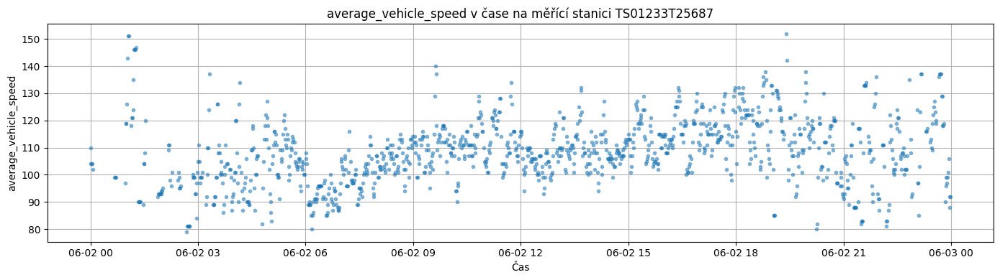

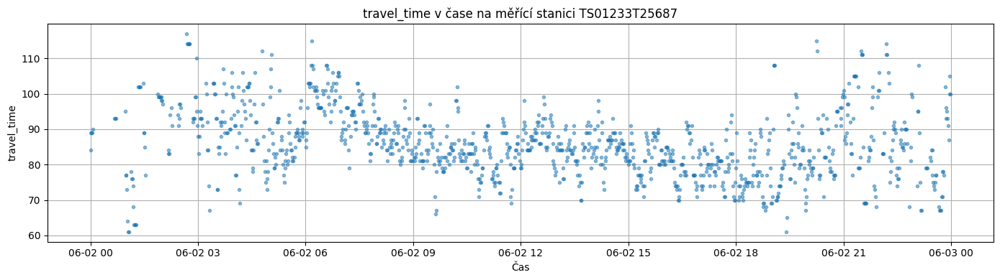

In [7]:
%matplotlib inline
station_id = "TS01233T25687"
df_station = df_fcd[df_fcd["source_identification"] == station_id]

cols_to_plot = ["average_vehicle_speed", "travel_time"]

for col in cols_to_plot:
    plt.figure(figsize=(14, 4))
    plt.plot(df_station["measurement_or_calculation_time"], 
             df_station[col], 
             marker=".", linestyle="none", alpha=0.5)
    
    plt.title(f"{col} v čase na měřící stanici {station_id}")
    plt.xlabel("Čas")
    plt.ylabel(col)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

### Čištění dat

In [8]:
# Odstranění prázdných sloupců
empty = [col for col in df_fcd.columns if df_fcd[col].isnull().all()]
df_fcd.drop(empty, axis=1, inplace=True)

# Odranění sloupců s nulovou variabilitou
df_fcd = df_fcd.loc[:, df_fcd.nunique() > 1]

# odstranění neužitečných sloupců
useless = ['publication_time', 'created_at', 'updated_at', 'predefined_location']
df_fcd.drop(useless, axis=1, inplace=True)

/tmp/ipykernel_26987/2921489619.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fcd.drop(useless, axis=1, inplace=True)


In [9]:
print(df_fcd.columns.values)

['source_identification' 'measurement_or_calculation_time' 'traffic_level'
 'data_quality' 'input_values' 'average_vehicle_speed' 'travel_time'
 'free_flow_travel_time' 'free_flow_speed']


### Další průzkum

In [10]:
# zavedení sloupců speed_difference (= rozdíl average_vehicle_speed a free_flow_speed) a time_difference (= rozdíl travel_time a free_flow_travel_time)
df_fcd["speed_difference"] = df_fcd["free_flow_speed"] - df_fcd["average_vehicle_speed"]
df_fcd["time_difference"] = df_fcd["free_flow_travel_time"] - df_fcd["travel_time"]

/tmp/ipykernel_26987/907141440.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fcd["speed_difference"] = df_fcd["free_flow_speed"] - df_fcd["average_vehicle_speed"]
/tmp/ipykernel_26987/907141440.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fcd["time_difference"] = df_fcd["free_flow_travel_time"] - df_fcd["travel_time"]


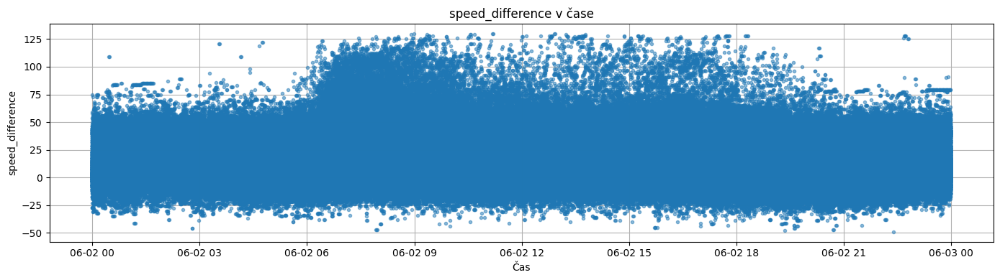

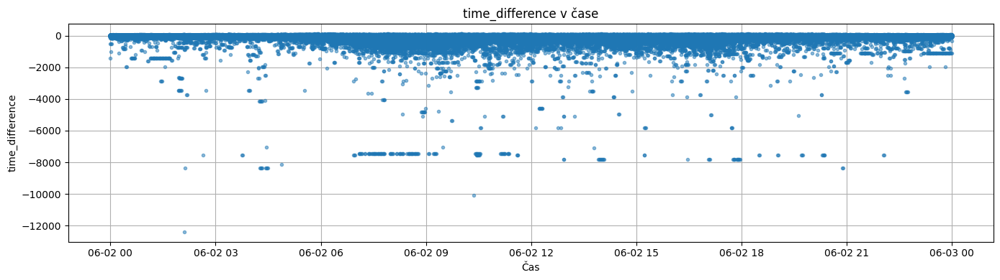

In [11]:
%matplotlib inline

cols_to_plot = ["speed_difference", "time_difference"]

for col in cols_to_plot:
    plt.figure(figsize=(14, 4))
    plt.plot(df_fcd["measurement_or_calculation_time"], 
             df_fcd[col], 
             marker=".", linestyle="none", alpha=0.5)
    
    plt.title(f"{col} v čase")
    plt.xlabel("Čas")
    plt.ylabel(col)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

## NDIC

Data možná získat za období od 1.9.2021

Informace o dopravních událostech - nehody, uzavírky apod.


In [12]:
df_ncid = pd.read_csv('ndic_traffic_info_20250602_PO.csv', sep=';', encoding="iso-8859-2", low_memory=False)
df_ncid.head()

,exchange,publication_time,publication_creator,situation_id,situation_version,situation_version_time,situation_confidentiality,situation_information_status,situation_urgency,situation_record_version,...,road_surface_condition_measurements,winter_equipment_management_type,create_batch_id,created_at,created_by,update_batch_id,updated_at,updated_by,geom_alert_c_line,alert_c_direction
0,"{""supplierIdentification"":{""country"":""cz"",""nat...",2025-06-02 04:34:00.000 +0200,"{""country"":""cz"",""nationalIdentifier"":""NDIC""}",ff808181-963e-4ef4-0197-2e6a3a412813,2,2025-06-02 04:33:17.000 +0200,noRestriction,real,normalUrgency,2,...,NaN,NaN,NaN,2025-06-02 04:34:00.584 +0200,NaN,NaN,2025-06-02 04:34:00.584 +0200,NaN,"LINESTRING (14.73123 50.04692, 14.73307 50.06924)",negative
1,"{""supplierIdentification"":{""country"":""cz"",""nat...",2025-06-02 04:34:00.000 +0200,"{""country"":""cz"",""nationalIdentifier"":""NDIC""}",ff808181-963e-4ef4-0197-2e7073b62819,2,2025-06-02 04:33:39.000 +0200,noRestriction,real,urgent,2,...,NaN,NaN,NaN,2025-06-02 04:34:00.584 +0200,NaN,NaN,2025-06-02 04:34:00.584 +0200,NaN,"LINESTRING (15.16369 50.11856, 15.12495 50.11797)",negative
2,"{""supplierIdentification"":{""country"":""cz"",""nat...",2025-06-02 04:34:00.000 +0200,"{""country"":""cz"",""nationalIdentifier"":""NDIC""}",ff808181-963e-4ef4-0197-2e7073b62819,2,2025-06-02 04:33:39.000 +0200,noRestriction,real,urgent,2,...,NaN,NaN,NaN,2025-06-02 04:34:00.584 +0200,NaN,NaN,2025-06-02 04:34:00.584 +0200,NaN,"LINESTRING (15.16369 50.11856, 15.12495 50.11797)",negative
3,"{""supplierIdentification"":{""country"":""cz"",""nat...",2025-06-02 04:34:00.000 +0200,"{""country"":""cz"",""nationalIdentifier"":""NDIC""}",ff808181-963e-4ef4-0197-2e7073b62819,2,2025-06-02 04:33:39.000 +0200,noRestriction,real,urgent,2,...,NaN,NaN,NaN,2025-06-02 04:34:00.584 +0200,NaN,NaN,2025-06-02 04:34:00.584 +0200,NaN,"LINESTRING (15.16369 50.11856, 15.12495 50.11797)",negative
4,"{""supplierIdentification"":{""country"":""cz"",""nat...",2025-06-02 06:40:22.000 +0200,"{""country"":""cz"",""nationalIdentifier"":""NDIC""}",db7e8ed6-bd21-4532-af0b-95839236b6ac,7,2025-06-02 06:39:23.000 +0200,noRestriction,real,urgent,7,...,NaN,NaN,NaN,2025-06-02 06:40:23.501 +0200,NaN,NaN,2025-06-02 06:40:23.501 +0200,NaN,"LINESTRING (14.21592 50.03393, 14.17978 50.00897)",negative


In [13]:
df_ncid.columns.values

array(['exchange', 'publication_time', 'publication_creator',
       'situation_id', 'situation_version', 'situation_version_time',
       'situation_confidentiality', 'situation_information_status',
       'situation_urgency', 'situation_record_version',
       'situation_record_type', 'situation_record_creation_time',
       'situation_record_version_time', 'probability_of_occurrence',
       'source', 'validity_status', 'validity_overall_start_time',
       'validity_overall_end_time', 'impact_capacity_remaining',
       'impact_number_of_lanes_restricted',
       'impact_number_of_operational_lanes',
       'impact_original_number_of_lanes',
       'impact_traffic_constriction_type', 'impact_delays_type',
       'impact_delay_time_value', 'cause', 'general_public_comment',
       'group_of_locations_type', 'supplementary_positional_description',
       'destination', 'alert_c_linear', 'linear_within_linear_element',
       'global_network_linear', 'linear_extension', 'geom_gn_line'

## Waze - route lives

Časy dojezdností https://golemio.cz/data/doprava

Některé ty první/brzké jsou zhruba od 30.9.2021 a všechny ostatní se přidávaly různě postupně v čase i napříč roky. Tak některé jsou mnohdy i dost později definované a sbírané, např. mosty nebo tunely atd.

Vzorky jsou za 3 trasy a jeden den:

- ID 22690; 1a. Z ul. 5. května přes Legerovu a Wilsonovu k Bubenské ul. (z centra),
- ID 22694; 18b. Tunely Blanka => Strahov => Zlíchov - z ul. V Holešovičkách na Strakonickou (S-J),
- ID 24260; 19a. Vítězné nám. => Evropská => LKPR (z centra)

Sloupce:
- time - čas průjezdu
- length - délka trasy (samozřejmě konstantní pro každou trasu)
- jam level - hodnoty 0 až 4


In [14]:
df_wazeRL = pd.read_csv('wazett_route_lives_20240603.csv', sep=';')
df_wazeRL.head()

,route_id,update_time,time,length,historic_time,jam_level,create_batch_id,created_at,created_by,update_batch_id,updated_at,updated_by
0,22690,2023-10-26 08:20:05.272 +0200,885,4881,1316,2,NaN,2023-10-26 08:20:10.458 +0200,NaN,NaN,2023-10-26 08:20:10.458 +0200,NaN
1,22694,2023-10-26 08:20:05.272 +0200,917,13305,872,0,NaN,2023-10-26 08:20:13.074 +0200,NaN,NaN,2023-10-26 08:20:13.074 +0200,NaN
2,22690,2023-10-26 08:22:03.321 +0200,873,4881,1327,2,NaN,2023-10-26 08:22:08.179 +0200,NaN,NaN,2023-10-26 08:22:08.179 +0200,NaN
3,22694,2023-10-26 08:22:03.321 +0200,921,13305,870,0,NaN,2023-10-26 08:22:10.691 +0200,NaN,NaN,2023-10-26 08:22:10.691 +0200,NaN
4,22690,2023-10-26 08:24:02.953 +0200,933,4881,1333,2,NaN,2023-10-26 08:24:07.639 +0200,NaN,NaN,2023-10-26 08:24:07.639 +0200,NaN


In [15]:
df_wazeRL = df_wazeRL.drop(['create_batch_id', 'created_by', 'update_batch_id', 'updated_by'], axis=1)

In [16]:
df_wazeRL.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2232037 entries, 0 to 2232036
Data columns (total 8 columns):
 #   Column         Dtype 
---  ------         ----- 
 0   route_id       int64 
 1   update_time    object
 2   time           int64 
 3   length         int64 
 4   historic_time  int64 
 5   jam_level      int64 
 6   created_at     object
 7   updated_at     object
dtypes: int64(5), object(3)
memory usage: 136.2+ MB


In [17]:
df_wazeRL.route_id = df_wazeRL.route_id.astype("category")

df_wazeRL['update_time'] = pd.to_datetime(df_wazeRL['update_time'].astype(str), utc=True)
df_wazeRL['update_time'] = df_wazeRL['update_time'].dt.tz_convert('Europe/Prague')

df_wazeRL['created_at'] = pd.to_datetime(df_wazeRL['created_at'].astype(str), utc=True)
df_wazeRL['created_at'] = df_wazeRL['created_at'].dt.tz_convert('Europe/Prague')

df_wazeRL['updated_at'] = pd.to_datetime(df_wazeRL['updated_at'].astype(str), utc=True)
df_wazeRL['updated_at'] = df_wazeRL['updated_at'].dt.tz_convert('Europe/Prague')

df_wazeRL.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2232037 entries, 0 to 2232036
Data columns (total 8 columns):
 #   Column         Dtype                        
---  ------         -----                        
 0   route_id       category                     
 1   update_time    datetime64[ns, Europe/Prague]
 2   time           int64                        
 3   length         int64                        
 4   historic_time  int64                        
 5   jam_level      int64                        
 6   created_at     datetime64[ns, Europe/Prague]
 7   updated_at     datetime64[ns, Europe/Prague]
dtypes: category(1), datetime64[ns, Europe/Prague](3), int64(4)
memory usage: 121.3 MB


In [18]:
profile = ProfileReport(df_wazeRL, 
                        title="Profiling Report", 
                        correlations={
                            "pearson": {"calculate": False},
                            "spearman": {"calculate": False},
                            "kendall": {"calculate": False},
                            "phi_k": {"calculate": False},
                            "auto": {"calculate": False},
                        },
                        interactions={
                            "continuous": False,
                            "targets": []
                        })
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 8/8 [00:21<00:00,  2.64s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
mask = df_wazeRL['update_time'] == pd.Timestamp('1970-01-01 01:00:00+01:00')
df_wazeRL[mask]

,route_id,update_time,time,length,historic_time,jam_level,created_at,updated_at
1736028,22690,1970-01-01 01:00:00+01:00,347,4881,339,0,2021-10-05 20:01:31.402000+02:00,2022-05-02 04:32:01.866000+02:00
1736029,22694,1970-01-01 01:00:00+01:00,742,13260,742,0,2021-10-05 20:01:34.667000+02:00,2022-05-02 04:32:07.875000+02:00


In [20]:
df_wazeRL = df_wazeRL[df_wazeRL['update_time'] != pd.Timestamp('1970-01-01 01:00:00+01:00')]

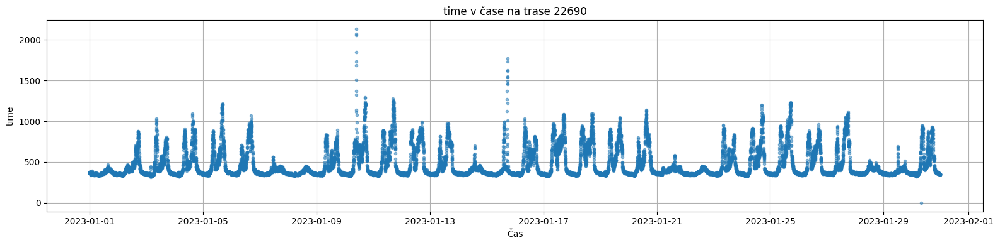

In [21]:
%matplotlib inline
route_id = 22690
start_date = pd.Timestamp("2023-01-01 00:00:00", tz="Europe/Prague")
end_date = pd.Timestamp("2023-01-31 00:00:00", tz="Europe/Prague")

df_wazeRL_route = df_wazeRL[
    (df_wazeRL["route_id"] == route_id)
    & (df_wazeRL["update_time"] >= start_date)
    & (df_wazeRL["update_time"] <= end_date)
]

cols_to_plot = ["time", "jam_level"]
col = "time"

plt.figure(figsize=(16, 4))
plt.plot(df_wazeRL_route["update_time"], 
            df_wazeRL_route[col], 
            marker=".", linestyle="none", alpha=0.5)

plt.title(f"{col} v čase na trase {route_id}")
plt.xlabel("Čas")
plt.ylabel(col)
plt.grid(True)
plt.tight_layout()
plt.show()

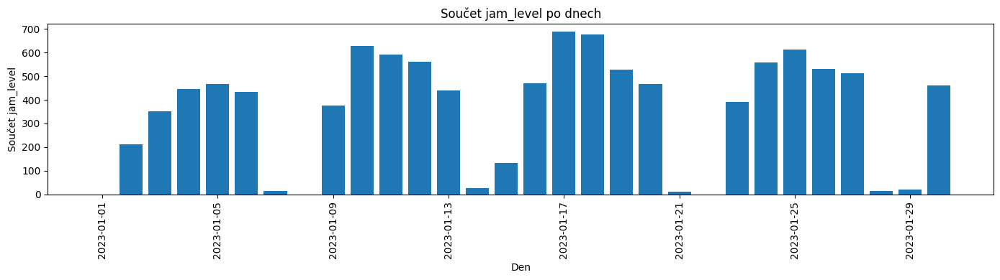

In [22]:
df_january = df_wazeRL_route[
    (df_wazeRL_route['update_time'].dt.year == 2023) &
    (df_wazeRL_route['update_time'].dt.month == 1)
]
daily = df_january.groupby(df_january['update_time'].dt.date)['jam_level'].sum()

plt.figure(figsize=(14, 4))
plt.bar(daily.index, daily.values)
plt.xlabel('Den')
plt.ylabel('Součet jam_level')
plt.title('Součet jam_level po dnech')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## Waze - alerts
Data od 1.1.2019

In [23]:
df_wazeAlerts = pd.read_csv('wazeccp_alerts_20250602_PO.csv', sep=';', encoding='cp1250')
df_wazeAlerts.head()

,id,uuid,pub_millis,pub_utc_date,road_type,location,street,city,country,magvar,...,jam_uuid,valid_from,downloaded_at,duplicate_count,create_batch_id,created_at,created_by,update_batch_id,updated_at,updated_by
0,00022aa4-ebfb-f44e-ea89-99ea6cca81eb,4e8f5c88-b4a7-4c4b-9883-c4dd9931c9c3,1748870974000,2025-06-02 13:29:34.000,7.0,"{""x"": 14.230892, ""y"": 49.913421}",Komenského,Řevnice,EZ,242,...,NaN,2025-06-02 15:30:06.379 +0200,2025-06-02 23:30:03.344 +0200,234,NaN,2025-06-02 15:30:28.461 +0200,NaN,NaN,2025-06-02 23:30:43.568 +0200,NaN
1,0009ce9c-c1b0-9699-1e0f-2796075d2e0a,3d672265-69fb-4632-886c-28a8a775f4a5,1748849318000,2025-06-02 07:28:38.000,2.0,"{""x"": 14.414716, ""y"": 50.069549}",Rašínovo nábřeží,Praha,EZ,352,...,NaN,2025-06-02 09:30:02.349 +0200,2025-06-02 10:00:07.281 +0200,15,NaN,2025-06-02 09:30:27.844 +0200,NaN,NaN,2025-06-02 10:00:29.601 +0200,NaN
2,000bef67-949f-6579-db94-8aacfac5fc29,2f24932e-2fd4-40b0-afd1-35309e7d9622,1748877656000,2025-06-02 15:20:56.000,2.0,"{""x"": 14.494464, ""y"": 50.098362}",Spojovací,Praha,EZ,327,...,NaN,2025-06-02 17:22:03.192 +0200,2025-06-02 17:50:02.021 +0200,14,NaN,2025-06-02 17:22:27.929 +0200,NaN,NaN,2025-06-02 17:50:34.829 +0200,NaN
3,001730a6-cff4-fa1d-7d4e-0a9502ba7d4e,02ba9b2d-96a1-430f-b1bd-8dfa9fc12198,1748843933000,2025-06-02 05:58:53.000,2.0,"{""x"": 14.310282, ""y"": 50.062064}",Plzeňská,Praha,EZ,70,...,NaN,2025-06-02 08:00:07.464 +0200,2025-06-02 08:14:01.951 +0200,7,NaN,2025-06-02 08:00:43.695 +0200,NaN,NaN,2025-06-02 08:14:26.370 +0200,NaN
4,001b7e76-48d8-fdde-3872-5759d8bf8289,3388f012-fd91-4e04-b790-c796f1ae1a3b,1748844686000,2025-06-02 06:11:26.000,3.0,"{""x"": 14.617874, ""y"": 50.103587}",D11,NaN,EZ,239,...,NaN,2025-06-02 08:12:00.999 +0200,2025-06-02 08:12:00.999 +0200,0,NaN,2025-06-02 08:12:05.874 +0200,NaN,NaN,2025-06-02 08:12:05.874 +0200,NaN


In [24]:
df_wazeAlerts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14156 entries, 0 to 14155
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id                           14156 non-null  object 
 1   uuid                         14156 non-null  object 
 2   pub_millis                   14156 non-null  int64  
 3   pub_utc_date                 14156 non-null  object 
 4   road_type                    14151 non-null  float64
 5   location                     14156 non-null  object 
 6   street                       13652 non-null  object 
 7   city                         9634 non-null   object 
 8   country                      14151 non-null  object 
 9   magvar                       14156 non-null  int64  
 10  reliability                  14156 non-null  int64  
 11  report_description           194 non-null    object 
 12  report_rating                14156 non-null  int64  
 13  confidence      

In [25]:
df_wazeAlerts.describe()

,pub_millis,road_type,magvar,reliability,report_rating,confidence,thumbs_up,jam_uuid,duplicate_count,create_batch_id,created_by,update_batch_id,updated_by
count,1.415600e+04,14151.000000,14156.000000,14156.000000,14156.000000,14156.000000,0.0,0.0,14156.000000,0.0,0.0,0.0,0.0
mean,1.748858e+12,3.656491,204.141212,5.614439,2.424272,0.234318,NaN,NaN,59.029952,NaN,NaN,NaN,NaN
std,1.603313e+07,2.208388,105.174481,1.202012,1.545080,0.713188,NaN,NaN,1229.964192,NaN,NaN,NaN,NaN
min,1.748824e+12,1.000000,0.000000,5.000000,0.000000,0.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN
25%,1.748843e+12,2.000000,112.000000,5.000000,1.000000,0.000000,NaN,NaN,4.000000,NaN,NaN,NaN,NaN
50%,1.748853e+12,3.000000,225.000000,5.000000,2.000000,0.000000,NaN,NaN,10.000000,NaN,NaN,NaN,NaN
75%,1.748872e+12,6.000000,290.000000,6.000000,4.000000,0.000000,NaN,NaN,15.000000,NaN,NaN,NaN,NaN
max,1.748908e+12,22.000000,359.000000,10.000000,5.000000,5.000000,NaN,NaN,60327.000000,NaN,NaN,NaN,NaN


In [26]:
df_wazeAlerts = df_wazeAlerts.drop(['country', 'report_by_municipality_user', 'report_description', 'thumbs_up', 'jam_uuid', 'create_batch_id', 'created_by', 'update_batch_id', 'updated_by'], axis=1)
df_wazeAlerts.head()

,id,uuid,pub_millis,pub_utc_date,road_type,location,street,city,magvar,reliability,report_rating,confidence,type,subtype,valid_from,downloaded_at,duplicate_count,created_at,updated_at
0,00022aa4-ebfb-f44e-ea89-99ea6cca81eb,4e8f5c88-b4a7-4c4b-9883-c4dd9931c9c3,1748870974000,2025-06-02 13:29:34.000,7.0,"{""x"": 14.230892, ""y"": 49.913421}",Komenského,Řevnice,242,5,3,0,HAZARD,HAZARD_ON_ROAD_POT_HOLE,2025-06-02 15:30:06.379 +0200,2025-06-02 23:30:03.344 +0200,234,2025-06-02 15:30:28.461 +0200,2025-06-02 23:30:43.568 +0200
1,0009ce9c-c1b0-9699-1e0f-2796075d2e0a,3d672265-69fb-4632-886c-28a8a775f4a5,1748849318000,2025-06-02 07:28:38.000,2.0,"{""x"": 14.414716, ""y"": 50.069549}",Rašínovo nábřeží,Praha,352,5,4,0,JAM,JAM_HEAVY_TRAFFIC,2025-06-02 09:30:02.349 +0200,2025-06-02 10:00:07.281 +0200,15,2025-06-02 09:30:27.844 +0200,2025-06-02 10:00:29.601 +0200
2,000bef67-949f-6579-db94-8aacfac5fc29,2f24932e-2fd4-40b0-afd1-35309e7d9622,1748877656000,2025-06-02 15:20:56.000,2.0,"{""x"": 14.494464, ""y"": 50.098362}",Spojovací,Praha,327,6,1,0,JAM,JAM_HEAVY_TRAFFIC,2025-06-02 17:22:03.192 +0200,2025-06-02 17:50:02.021 +0200,14,2025-06-02 17:22:27.929 +0200,2025-06-02 17:50:34.829 +0200
3,001730a6-cff4-fa1d-7d4e-0a9502ba7d4e,02ba9b2d-96a1-430f-b1bd-8dfa9fc12198,1748843933000,2025-06-02 05:58:53.000,2.0,"{""x"": 14.310282, ""y"": 50.062064}",Plzeňská,Praha,70,5,0,0,JAM,NaN,2025-06-02 08:00:07.464 +0200,2025-06-02 08:14:01.951 +0200,7,2025-06-02 08:00:43.695 +0200,2025-06-02 08:14:26.370 +0200
4,001b7e76-48d8-fdde-3872-5759d8bf8289,3388f012-fd91-4e04-b790-c796f1ae1a3b,1748844686000,2025-06-02 06:11:26.000,3.0,"{""x"": 14.617874, ""y"": 50.103587}",D11,NaN,239,5,4,0,HAZARD,HAZARD_ON_ROAD_OBJECT,2025-06-02 08:12:00.999 +0200,2025-06-02 08:12:00.999 +0200,0,2025-06-02 08:12:05.874 +0200,2025-06-02 08:12:05.874 +0200


In [27]:
# odstranění všeho, co se netýká Prahy
df_wazeAlerts['longitude'] = df_wazeAlerts['location'].apply(lambda x: json.loads(x)['x'] if pd.notna(x) else None)
df_wazeAlerts['latitude'] = df_wazeAlerts['location'].apply(lambda x: json.loads(x)['y'] if pd.notna(x) else None)

lat_min, lat_max = 49.95, 50.15
lon_min, lon_max = 14.35, 14.65
df_wazeAlerts = df_wazeAlerts[
    (
        # 1) city == NaN or ''
        (df_wazeAlerts['city'].isna()) |
        (df_wazeAlerts['city'].str.strip() == '')
    ) & 
    (
        (df_wazeAlerts['latitude'] >= lat_min) &
        (df_wazeAlerts['latitude'] <= lat_max) &
        (df_wazeAlerts['longitude'] >= lon_min) &
        (df_wazeAlerts['longitude'] <= lon_max)
    )
    |
    (
        # 2) city == Praha
        (df_wazeAlerts['city'].fillna('').str.lower().str.strip() == 'praha')
    )
]

In [28]:
profile = ProfileReport(df_wazeAlerts, 
                        title="Profiling Report", 
                        correlations={
                            "pearson": {"calculate": False},
                            "spearman": {"calculate": False},
                            "kendall": {"calculate": False},
                            "phi_k": {"calculate": False},
                            "auto": {"calculate": False},
                        },
                        interactions={
                            "continuous": False,
                            "targets": []
                        })
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 21/21 [00:01<00:00, 16.63it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Waze - irregularities

In [29]:
df_wazeIrr = pd.read_csv('wazeccp_irregularities_20250602_PO.csv', sep=';', encoding='cp1250')
df_wazeIrr.head()

,id,uuid,detection_date_millis,detection_date,detection_utc_date,update_date_millis,update_date,update_utc_date,street,city,...,cause_type,start_node,end_node,downloaded_at,create_batch_id,created_at,created_by,update_batch_id,updated_at,updated_by
0,93acf898c7f18994b6fb9654c72a4b2020042b62,1723706156,1748838039997,Mon Jun 2 04:20:39 +0000 2025,2025-06-02 04:20:39.997,1748840508399,Mon Jun 2 05:01:48 +0000 2025,2025-06-02 05:01:48.399,D1,Nupaky,...,NaN,Nupaky,Čestlice,2025-06-02 07:04:01.104 +0200,-1,2025-06-02 07:04:01.125 +0200,integration-engine,NaN,NaN,NaN
1,85fddfd142382c03a72b2aff02cc177ec928d796,1722876320,1748836380040,Mon Jun 2 03:53:00 +0000 2025,2025-06-02 03:53:00.040,1748840507539,Mon Jun 2 05:01:47 +0000 2025,2025-06-02 05:01:47.539,Modřanská,Praha,...,NaN,NaN,» Modřany / Braník,2025-06-02 07:04:01.104 +0200,-1,2025-06-02 07:04:01.125 +0200,integration-engine,NaN,NaN,NaN
2,3094492c9bfb09e34aa8656238c14adcccfcabd4,1723843806,1748838170253,Mon Jun 2 04:22:50 +0000 2025,2025-06-02 04:22:50.253,1748840506170,Mon Jun 2 05:01:46 +0000 2025,2025-06-02 05:01:46.170,D1,Kunice,...,NaN,Kunice,Všechromy,2025-06-02 07:04:01.104 +0200,-1,2025-06-02 07:04:01.125 +0200,integration-engine,NaN,NaN,NaN
3,89ee5faebaf7764bf68411e32296f70740aa0142,1725221168,1748839803040,Mon Jun 2 04:50:03 +0000 2025,2025-06-02 04:50:03.040,1748840510197,Mon Jun 2 05:01:50 +0000 2025,2025-06-02 05:01:50.197,Lipská,Praha,...,NaN,NaN,D7,2025-06-02 07:04:01.104 +0200,-1,2025-06-02 07:04:01.125 +0200,integration-engine,NaN,NaN,NaN
4,68ac359954b28ee04f315be83d82b73a1f0f93b9,1723709832,1748838041892,Mon Jun 2 04:20:41 +0000 2025,2025-06-02 04:20:41.892,1748840511103,Mon Jun 2 05:01:51 +0000 2025,2025-06-02 05:01:51.103,D7,Středokluky,...,NaN,Středokluky,Středokluky,2025-06-02 07:04:01.104 +0200,-1,2025-06-02 07:04:01.125 +0200,integration-engine,NaN,NaN,NaN


In [30]:
df_wazeIrr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4658 entries, 0 to 4657
Data columns (total 37 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     4658 non-null   object 
 1   uuid                   4658 non-null   int64  
 2   detection_date_millis  4658 non-null   int64  
 3   detection_date         4658 non-null   object 
 4   detection_utc_date     4658 non-null   object 
 5   update_date_millis     4658 non-null   int64  
 6   update_date            4658 non-null   object 
 7   update_utc_date        4658 non-null   object 
 8   street                 4658 non-null   object 
 9   city                   4658 non-null   object 
 10  country                4658 non-null   object 
 11  is_highway             4658 non-null   bool   
 12  speed                  4658 non-null   float64
 13  regular_speed          4658 non-null   float64
 14  delay_seconds          4658 non-null   int64  
 15  seco

In [31]:
df_wazeIrr.describe()

,uuid,detection_date_millis,update_date_millis,speed,regular_speed,delay_seconds,seconds,length,trend,severity,jam_level,drivers_count,alerts_count,n_thumbs_up,n_comments,n_images,create_batch_id,update_batch_id,updated_at,updated_by
count,4.658000e+03,4.658000e+03,4.658000e+03,4658.000000,4658.000000,4658.000000,4658.000000,4658.000000,4658.000000,4658.0,4658.000000,4658.000000,4658.000000,4658.0,4658.0,4658.0,4658.0,0.0,0.0,0.0
mean,1.751751e+09,1.748852e+12,1.748858e+12,13.192181,46.152368,752.775011,864.795406,2669.366252,-0.148991,5.0,3.591241,196.589094,3.017604,0.0,0.0,0.0,-1.0,NaN,NaN,NaN
std,2.773007e+07,1.223151e+07,1.314653e+07,10.710775,36.760292,627.848916,612.981922,2293.619598,0.835209,0.0,0.610854,215.520397,2.759665,0.0,0.0,0.0,0.0,NaN,NaN,NaN
min,1.722614e+09,1.748836e+12,1.748837e+12,0.880000,3.850000,-91.000000,99.000000,500.000000,-1.000000,5.0,1.000000,1.000000,0.000000,0.0,0.0,0.0,-1.0,NaN,NaN,NaN
25%,1.726271e+09,1.748841e+12,1.748846e+12,5.500000,16.210000,380.000000,479.000000,1023.000000,-1.000000,5.0,3.000000,48.000000,1.000000,0.0,0.0,0.0,-1.0,NaN,NaN,NaN
50%,1.745694e+09,1.748848e+12,1.748853e+12,9.650000,31.750000,601.000000,716.500000,2137.000000,0.000000,5.0,4.000000,138.000000,2.000000,0.0,0.0,0.0,-1.0,NaN,NaN,NaN
75%,1.769053e+09,1.748861e+12,1.748870e+12,17.840000,71.820000,922.000000,1084.500000,3334.000000,1.000000,5.0,4.000000,241.750000,4.000000,0.0,0.0,0.0,-1.0,NaN,NaN,NaN
max,1.858968e+09,1.748897e+12,1.748898e+12,78.270000,133.330000,7524.000000,5798.000000,15304.000000,1.000000,5.0,4.000000,1118.000000,25.000000,0.0,0.0,0.0,-1.0,NaN,NaN,NaN


In [32]:
df_wazeIrr = df_wazeIrr.drop(['update_batch_id', 'country', 'cause_type', 'updated_at', 'updated_by', 'created_by', 'severity', 'n_thumbs_up', 'n_comments', 'n_images', 'create_batch_id'], axis=1)
df_wazeIrr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4658 entries, 0 to 4657
Data columns (total 26 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     4658 non-null   object 
 1   uuid                   4658 non-null   int64  
 2   detection_date_millis  4658 non-null   int64  
 3   detection_date         4658 non-null   object 
 4   detection_utc_date     4658 non-null   object 
 5   update_date_millis     4658 non-null   int64  
 6   update_date            4658 non-null   object 
 7   update_utc_date        4658 non-null   object 
 8   street                 4658 non-null   object 
 9   city                   4658 non-null   object 
 10  is_highway             4658 non-null   bool   
 11  speed                  4658 non-null   float64
 12  regular_speed          4658 non-null   float64
 13  delay_seconds          4658 non-null   int64  
 14  seconds                4658 non-null   int64  
 15  leng

In [33]:
df_wazeIrr = df_wazeIrr[(df_wazeIrr['city'].fillna('').str.lower().str.strip() == 'praha')]

In [34]:
profile = ProfileReport(df_wazeIrr, 
                        title="Profiling Report", 
                        correlations={
                            "pearson": {"calculate": False},
                            "spearman": {"calculate": False},
                            "kendall": {"calculate": False},
                            "phi_k": {"calculate": False},
                            "auto": {"calculate": False},
                        },
                        interactions={
                            "continuous": False,
                            "targets": []
                        })
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 26/26 [00:00<00:00, 44.62it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Waze - jams
Data od 1.1.2019

In [35]:
import re
with open('wazeccp_jams_202506026_PO_neuplny_den.csv', 'r', encoding='cp1250', errors='ignore') as f:
    text = f.read()

text = text.replace('""', '"')

with open('wazeccp_jams_20250602_noquotes.csv', 'w', encoding='cp1250') as f:
    f.write(text)

In [36]:
df_wazeJams = pd.read_csv('wazeccp_jams_20250602_noquotes.csv', sep=';', encoding='cp1250')
df_wazeJams.head()

KeyboardInterrupt: 